# Data Wrangling Project 4 Udacity

### Project description:
In this project we will use all the steps of data wrangling to analize the data from the twitter account "WeRateDogs"

In [1]:
import pandas as pd
import requests
import os
import requests

In [2]:
import tweepy
from tweepy.auth import OAuthHandler
import json 
from timeit import default_timer as timer

In [3]:
df_enhanced = pd.read_csv(r'C:\Users\bianc\Documents\Udacity\twitter-archive-enhanced.csv')

In [4]:
df_enhanced.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


### Opening image and adding the image link to the dataframe:

In [5]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)
response

<Response [200]>

In [6]:
url

'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'

In [7]:
response.content

b"tweet_id\tjpg_url\timg_num\tp1\tp1_conf\tp1_dog\tp2\tp2_conf\tp2_dog\tp3\tp3_conf\tp3_dog\n666020888022790149\thttps://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg\t1\tWelsh_springer_spaniel\t0.465074\tTrue\tcollie\t0.156665\tTrue\tShetland_sheepdog\t0.0614285\tTrue\n666029285002620928\thttps://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg\t1\tredbone\t0.506826\tTrue\tminiature_pinscher\t0.07419169999999999\tTrue\tRhodesian_ridgeback\t0.07201\tTrue\n666033412701032449\thttps://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg\t1\tGerman_shepherd\t0.596461\tTrue\tmalinois\t0.13858399999999998\tTrue\tbloodhound\t0.11619700000000001\tTrue\n666044226329800704\thttps://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg\t1\tRhodesian_ridgeback\t0.408143\tTrue\tredbone\t0.360687\tTrue\tminiature_pinscher\t0.222752\tTrue\n666049248165822465\thttps://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg\t1\tminiature_pinscher\t0.560311\tTrue\tRottweiler\t0.243682\tTrue\tDoberman\t0.154629\tTrue\n666050758794694657\thttps://pbs.twimg.com/

In [8]:
open("image_prediction.tsv", "wb").write(response.content)

335079

In [9]:
image_prediction = pd.read_csv("image_prediction.tsv", sep="\t")
image_prediction.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


### Read format 2 for image: 

In [10]:
url3 = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response3 = requests.get(url3)
display(response3.content)
with open("image_prediction.tsv", "wb") as file3:
    file3.write(response.content)
df2 = pd.read_csv(r"C:\Users\bianc\Downloads\image-predictions.tsv", sep="\t")
display(df2)

b"tweet_id\tjpg_url\timg_num\tp1\tp1_conf\tp1_dog\tp2\tp2_conf\tp2_dog\tp3\tp3_conf\tp3_dog\n666020888022790149\thttps://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg\t1\tWelsh_springer_spaniel\t0.465074\tTrue\tcollie\t0.156665\tTrue\tShetland_sheepdog\t0.0614285\tTrue\n666029285002620928\thttps://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg\t1\tredbone\t0.506826\tTrue\tminiature_pinscher\t0.07419169999999999\tTrue\tRhodesian_ridgeback\t0.07201\tTrue\n666033412701032449\thttps://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg\t1\tGerman_shepherd\t0.596461\tTrue\tmalinois\t0.13858399999999998\tTrue\tbloodhound\t0.11619700000000001\tTrue\n666044226329800704\thttps://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg\t1\tRhodesian_ridgeback\t0.408143\tTrue\tredbone\t0.360687\tTrue\tminiature_pinscher\t0.222752\tTrue\n666049248165822465\thttps://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg\t1\tminiature_pinscher\t0.560311\tTrue\tRottweiler\t0.243682\tTrue\tDoberman\t0.154629\tTrue\n666050758794694657\thttps://pbs.twimg.com/

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\bianc\\Downloads\\image-predictions.tsv'

### Read format 1:

In [11]:
!pip install tweepy

In [17]:
# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# These are hidden to comply with Twitter's API terms and conditions
consumer_key = 'HIDDEN'
consumer_secret = 'HIDDEN'
access_token = 'HIDDEN'
access_secret = 'HIDDEN'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)

In [12]:
file = 'tweet_json.txt'
if not os.path.isfile(file):
    open(file, 'w', encoding = 'UTF-8')

In [25]:
# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# NOTE TO REVIEWER: this student had mobile verification issues so the following
# Twitter API code was sent to this student from a Udacity instructor
# Tweet IDs for which to gather additional data via Twitter's API
tweet_ids = df.tweet_id.values
len(tweet_ids)

# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
fails_dict = {}
start = timer()
# Save each tweet's returned JSON as a new line in a .txt file
with open('tweet_json.txt', 'w') as outfile:
    df_datalist = []
    # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.TweepError as e:
            fails_dict[tweet_id] = e
            pass
            
end = timer()
print(end - start)
print(fails_dict)

1: 892420643555336193
2: 892177421306343426
3: 891815181378084864
4: 891689557279858688
5: 891327558926688256
6: 891087950875897856
7: 890971913173991426
8: 890729181411237888
9: 890609185150312448
10: 890240255349198849
11: 890006608113172480
12: 889880896479866881
13: 889665388333682689
14: 889638837579907072
15: 889531135344209921
16: 889278841981685760
17: 888917238123831296
18: 888804989199671297
19: 888554962724278272
20: 888202515573088257
21: 888078434458587136
22: 887705289381826560
23: 887517139158093824
24: 887473957103951883
25: 887343217045368832
26: 887101392804085760
27: 886983233522544640
28: 886736880519319552
29: 886680336477933568
30: 886366144734445568
31: 886267009285017600
32: 886258384151887873
33: 886054160059072513
34: 885984800019947520
35: 885528943205470208
36: 885518971528720385
37: 885311592912609280
38: 885167619883638784
39: 884925521741709313
40: 884876753390489601
41: 884562892145688576
42: 884441805382717440
43: 884247878851493888
44: 8841626705843773

In [31]:
print(end - start)


974.9712268000001


In [27]:
#Print all the errors
print(fails_dict)

{892420643555336193: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 892177421306343426: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 891815181378084864: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 891689557279858688: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 891327558926688256: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 891087950875897856: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 890971913173991426: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 890729181411237888: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 890609185150312448: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 890240255349198849: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 890006608113172480: TweepError([{'code': 89, 'message': 'Invalid or expired token.'}]), 889880896479866881: TweepError(

In [13]:
with open("tweet_json.txt") as file:
    dataset = [json.loads(line) 
              for line in file]
df2_json = pd.DataFrame(dataset)
display(df2_json.shape)

(2354, 31)

### Read format 2: 

#### Creating a dataframe from tweet_json file:


In [14]:
url2 = "https://video.udacity-data.com/topher/2018/November/5be5fb7d_tweet-json/tweet-json.txt"
response2 = requests.get(url2)
response2
response2.content

b'{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, "id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], "media": [{"id": 892420639486877696, "id_str": "892420639486877696", "indices": [86, 109], "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": "https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": "photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": {"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, "resize": "fit"}, "medium": {"w": 540, "h": 528, "resize": "fit"}}}]}, "extended_entities": {"me

In [15]:
open("tweet_json.txt", "wb").write(response2.content)

10609234

In [16]:
df_datalist = []
with open("tweet_json.txt") as file:
    for line in file:
        df_datalist.append(json.loads(line))
df_json = pd.DataFrame(df_datalist)
display(df_json)
display(df_json.shape)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,...,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,Tue Aug 01 16:23:56 +0000 2017,892420643555336193,892420643555336193,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,39467,False,False,False,False,en,NaN,NaN,NaN,NaN
1,Tue Aug 01 00:17:27 +0000 2017,892177421306343426,892177421306343426,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,33819,False,False,False,False,en,NaN,NaN,NaN,NaN
2,Mon Jul 31 00:18:03 +0000 2017,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796480, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,25461,False,False,False,False,en,NaN,NaN,NaN,NaN
3,Sun Jul 30 15:58:51 +0000 2017,891689557279858688,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799489, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,42908,False,False,False,False,en,NaN,NaN,NaN,NaN
4,Sat Jul 29 16:00:24 +0000 2017,891327558926688256,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,41048,False,False,False,False,en,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2349,Mon Nov 16 00:24:50 +0000 2015,666049248165822465,666049248165822465,Here we have a 1949 1st generation vulpix. Enj...,False,"[0, 120]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 666049244999131136, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,111,False,False,False,False,en,NaN,NaN,NaN,NaN
2350,Mon Nov 16 00:04:52 +0000 2015,666044226329800704,666044226329800704,This is a purebred Piers Morgan. Loves to Netf...,False,"[0, 137]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 666044217047650304, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,311,False,False,False,False,en,NaN,NaN,NaN,NaN
2351,Sun Nov 15 23:21:54 +0000 2015,666033412701032449,666033412701032449,Here is a very happy pup. Big fan of well-main...,False,"[0, 130]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 666033409081393153, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,128,False,False,False,False,en,NaN,NaN,NaN,NaN
2352,Sun Nov 15 23:05:30 +0000 2015,666029285002620928,666029285002620928,This is a western brown Mitsubishi terrier. Up...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 666029276303482880, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,132,False,False,False,False,en,NaN,NaN,NaN,NaN


(2354, 31)

In [17]:
## Check if column "retweet_count" is in df_json:
letters_in_dataframe = "retweet_count" in df_json
print(letters_in_dataframe)

True


In [18]:
## Changing the dataframe to let only the columns for id, retweet and favorite count: 
df_json_new = pd.DataFrame(df_datalist, columns = {"id",
                                              "retweet_count",
                                              "favorite_count"})
df_json_new.head()

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


In [19]:
display(df_json_new.shape)

(2354, 3)

In [20]:
## Rename the column "id" to "tweet_id" to mantain the format in the 3 dataframes:
df_json_new = df_json_new.rename(columns = {"id": "tweet_id"})
df_json_new.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


### Read format 3

In [21]:
df3_json = pd.read_json("tweet_json.txt", lines = True)
print(df3_json.shape)

(2354, 31)


## Assess: 
In this assessment we will use first a Visual assessment with  excel and then a Programmatic assessment using pandas method and functions to identify quality and tidiness problems of the data gathered. 

#### Visual assessment in excel:

In [22]:
#Export the dataframes gathered as csv file to open them in excel to do the visual assessment:
df_json_new.to_csv(r'C:\Users\bianc\Documents\df_json_new.csv', header=True)
image_prediction.to_csv(r'C:\Users\bianc\Documents\image_prediction.csv', header=True)
df_enhanced.to_csv(r'C:\Users\bianc\Documents\df_enhanced.csv', header=True)

#### Programmatic assessment:

#### Creating a copy of the datasets to make modifications

In [23]:
# copy of the dataframe of the json file:
df_json_new_copy = df_json_new.copy()
display(df_json_new_copy)

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


In [24]:
# copy of the dataframe of the image_prediction file: 
image_prediction_copy = image_prediction.copy()
image_prediction_copy.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [25]:
# copy of the dataframe of the twitter-archive-enhanced file: 
df_enhanced_copy = df_enhanced.copy()
df_enhanced_copy.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [26]:
df_json_new_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2354 non-null   int64
 1   retweet_count   2354 non-null   int64
 2   favorite_count  2354 non-null   int64
dtypes: int64(3)
memory usage: 55.3 KB


In [27]:
image_prediction_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [28]:
df_enhanced_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [29]:
image_prediction_copy.sample(3)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
956,705428427625635840,https://pbs.twimg.com/media/CcovaMUXIAApFDl.jpg,1,Chihuahua,0.774792,True,quilt,0.073079,False,Pembroke,0.022365,True
1983,871879754684805121,https://pbs.twimg.com/media/DBmKAmBXUAE-pQ-.jpg,1,Shetland_sheepdog,0.969171,True,collie,0.018261,True,Pomeranian,0.008515,True
1910,853299958564483072,https://pbs.twimg.com/media/C9eHyF7XgAAOxPM.jpg,1,grille,0.652280,False,beach_wagon,0.112846,False,convertible,0.086252,False


In [30]:
df_json_new_copy.describe()

,tweet_id,retweet_count,favorite_count
count,2.354000e+03,2354.000000,2354.000000
mean,7.426978e+17,3164.797366,8080.968564
std,6.852812e+16,5284.770364,11814.771334
min,6.660209e+17,0.000000,0.000000
25%,6.783975e+17,624.500000,1415.000000
50%,7.194596e+17,1473.500000,3603.500000
75%,7.993058e+17,3652.000000,10122.250000
max,8.924206e+17,79515.000000,132810.000000


In [31]:
image_prediction_copy.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [32]:
df_enhanced_copy.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [33]:
df_json_new_copy.value_counts()

tweet_id            retweet_count  favorite_count
892420643555336193  8853           39467             1
687102708889812993  1124           2571              1
687826841265172480  1292           2989              1
687818504314159109  1080           2758              1
687807801670897665  801            2625              1
                                                    ..
774757898236878852  2035           9462              1
774639387460112384  2013           7508              1
774314403806253056  6478           24167             1
773985732834758656  4492           11925             1
666020888022790149  532            2535              1
Length: 2354, dtype: int64

In [34]:
image_prediction_copy.value_counts()

tweet_id            jpg_url                                                                                  img_num  p1                      p1_conf   p1_dog  p2                p2_conf   p2_dog  p3                   p3_conf   p3_dog
892420643555336193  https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg                                          1        orange                  0.097049  False   bagel             0.085851  False   banana               0.076110  False     1
685321586178670592  https://pbs.twimg.com/media/CYLAWFMWMAEcRzb.jpg                                          1        Boston_bull             0.972483  True    French_bulldog    0.025469  True    boxer                0.000458  True      1
683834909291606017  https://pbs.twimg.com/ext_tw_video_thumb/683834825250320385/pu/img/yZdrqMlyky4KGOu6.jpg  1        Maltese_dog             0.738449  True    toy_poodle        0.102992  True    Samoyed              0.023247  True      1
683849932751646720  https://pbs.twimg.com/media/C

In [35]:
#To find duplicated values in json dataframe:
df_json_new_copy.duplicated().value_counts()

False    2354
dtype: int64

In [36]:
#To find duplicated values in the tweet_id in the json dataframe:
print(df_json_new_copy['tweet_id'].duplicated().value_counts())

False    2354
Name: tweet_id, dtype: int64


In [37]:
df_json_new_copy['tweet_id'].isnull()

0       False
1       False
2       False
3       False
4       False
        ...  
2349    False
2350    False
2351    False
2352    False
2353    False
Name: tweet_id, Length: 2354, dtype: bool

In [38]:
#To find how many unique values are for tweet_id:
df_json_new_copy['tweet_id'].nunique()

2354

In [39]:
#To find duplicated values in the tweet_id in the image_prediction dataframe:
print(image_prediction_copy['tweet_id'].duplicated().value_counts())

False    2075
Name: tweet_id, dtype: int64


In [40]:
#To find duplicated values in the tweet_id in the enhanced dataframe:
print(df_enhanced_copy['tweet_id'].duplicated().value_counts())

False    2356
Name: tweet_id, dtype: int64


In [41]:
#To find how many values are different from 10 in the denominator column for the rating:
df_enhanced_copy[df_enhanced_copy.rating_denominator != 10].count()[0]

23

In [42]:
#To find if the columns doggo, floofer, pupper, puppo have rows different from "None":

In [43]:
df_enhanced_copy[df_enhanced_copy.doggo != "None"].count()[0]

97

In [44]:
df_enhanced_copy[df_enhanced_copy.floofer != "None"].count()[0]

10

In [45]:
df_enhanced_copy[df_enhanced_copy.pupper != "None"].count()[0]

257

In [46]:
df_enhanced_copy[df_enhanced_copy.puppo!= "None"].count()[0]

30

### Assessing 8 Quality and 2 Tidiness issues

#### After the assessment of the 3 dataframes, the following problems were found: 
#### Quality:
1) "timestamp" it has object as its datatype, it should be datetime datatype #OK <br> 
2) "tweet_id" for the 3 dataframes has a int64 datatype but it should be a string or object datatype. #OK<br> 
3) "jpg_urls" does not have images for every tweet_id when the 3 dataframes merched in 1 <br>
4) "rating_denominator" has 23 values different from 10 which is the default denominator. #OK <br>
*Removing requirement of retweets, only leaving original tweets.* <br>
5) In "df_enhanced_copy" dataframe has NaN for "retweeted_status_id" #OK<br>
6) In "df_enhanced_copy" dataframe has NaN for "retweeted_status_user_id" #OK<br>
7) In "df_enhanced_copy" dataframe has NaN for "retweeted_status_timestamp" #OK<br>
8) In "df_enhanced_copy" dataframe has NaN for "in_reply_to_status_id" #OK<br>
9) In "df_enhanced_copy" dataframe has NaN for "in_reply_to_user_id #OK"



#### Tydiness:
1) In "df_enhanced_copy" dataframe the column timestamp includes date and time in the same column, it would be good to separate the date from the hour #OK<br> 
2) 4 variables as columns instead of 1 column: For the different characteristic name of the dog coming from the "Doggo lingo language says" such as doggo, floofer, pupper, puppo, are all in 4 different columns and not grouped by only 1 column which could help more for the analysis. #OK<br>
3) It should be 1 dataframe that includes all the information, and it can be done because it has the twitter_id as a common variable. #OK<br>



## Cleaning: 
### Cleaning the 8 Quality and 2 Tidiness problems found before

First, for this step we will use the copies made before from the originals dataframes. 

#### Quality.1 
From the "df_enhanced_copy" dataframe "timestamp" has object as its datatype, it should be datetime datatype.
#### Describe.1

Change the datatype by using the to_datetime method from pandas

In [47]:
import datetime
df_enhanced_copy["timestamp"] = pd.to_datetime(df_enhanced_copy["timestamp"])

In [48]:
display(df_enhanced_copy["timestamp"])

0      2017-08-01 16:23:56+00:00
1      2017-08-01 00:17:27+00:00
2      2017-07-31 00:18:03+00:00
3      2017-07-30 15:58:51+00:00
4      2017-07-29 16:00:24+00:00
                  ...           
2351   2015-11-16 00:24:50+00:00
2352   2015-11-16 00:04:52+00:00
2353   2015-11-15 23:21:54+00:00
2354   2015-11-15 23:05:30+00:00
2355   2015-11-15 22:32:08+00:00
Name: timestamp, Length: 2356, dtype: datetime64[ns, UTC]

#### Test.1
Checking that the datatype change was made succesfully: 

In [49]:
df_enhanced_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   int64              
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

####  Quality.2
"tweet_id" for the 3 dataframes has a int64 datatype but it should be a string or object datatype.

#### Describe.2
To change the datatype it is necessary to use the .astype method to a fast change to string datatype

In [50]:
df_json_new_copy["tweet_id"] = df_json_new_copy["tweet_id"].astype(str)
image_prediction_copy["tweet_id"] = image_prediction_copy["tweet_id"].astype(str)
df_enhanced_copy["tweet_id"] = df_enhanced_copy["tweet_id"].astype(str)


#### Test.2
Verifying the datatype change using .info()

In [51]:
df_json_new_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        2354 non-null   object
 1   retweet_count   2354 non-null   int64 
 2   favorite_count  2354 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 55.3+ KB


In [52]:
image_prediction_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   object 
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


In [53]:
df_enhanced_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

In [54]:
df_enhanced_copy.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


#### Quality.4: 
The column "rating_denominator" has 23 values different from 10 which is the default denominator.

#### Describe:
With .loc we will select only the rows that includes a different value from 10 as a rating denominator.<br>
Then, we will replace that selection for 10 as the rating denominator

In [55]:
dif_denominator = df_enhanced_copy[df_enhanced_copy.rating_denominator != 10]
dif_denominator

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
313,835246439529840640,8.352460e+17,2.625958e+07,2017-02-24 21:54:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",@jonnysun @Lin_Manuel ok jomny I know you're e...,NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
342,832088576586297345,8.320875e+17,3.058208e+07,2017-02-16 04:45:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",@docmisterio account started on 11/15/15,NaN,NaN,NaN,NaN,11,15,None,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40+00:00,"<a href=""http://twitter.com/download/iphone"" r...",The floofs have been released I repeat the flo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/820690176...,84,70,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Meet Sam. She smiles 24/7 &amp; secretly aspir...,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://tw...",24,7,Sam,None,None,None,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06+00:00,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: After so many requests, this is...",7.403732e+17,4.196984e+09,2016-06-08 02:41:38 +0000,https://twitter.com/dog_rates/status/740373189...,9,11,None,None,None,None,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Why does this never happen at my front door......,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244...,165,150,None,None,None,None,None
1068,740373189193256964,NaN,NaN,2016-06-08 02:41:38+00:00,"<a href=""http://twitter.com/download/iphone"" r...","After so many requests, this is Bretagne. She ...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/740373189...,9,11,None,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Say hello to this unbelievably well behaved sq...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023...,204,170,this,None,None,None,None
1165,722974582966214656,NaN,NaN,2016-04-21 02:25:47+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Happy 4/20 from the squad! 13/10 for all https...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/722974582...,4,20,None,None,None,None,None
1202,716439118184652801,NaN,NaN,2016-04-03 01:36:11+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Bluebert. He just saw that both #Final...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/716439118...,50,50,Bluebert,None,None,None,None


In [56]:
df_enhanced_copy.loc[df_enhanced_copy.rating_denominator != "10", "rating_denominator"] = "10"

#### Testing.4: 

In [57]:
#Test if the are any rating denominator left with a value different from 10:
df_enhanced_copy.rating_denominator.value_counts()

10    2356
Name: rating_denominator, dtype: int64

#### Quality 5, 6, 7, 8 and 9:

5) In "df_enhanced_copy" dataframe has NaN for "retweeted_status_id" <br>
6) In "df_enhanced_copy" dataframe has NaN for "retweeted_status_user_id"<br>
7) In "df_enhanced_copy" dataframe has NaN for "retweeted_status_timestamp" <br>
8) In "df_enhanced_copy" dataframe has NaN for "in_reply_to_status_id" <br>
9) In "df_enhanced_copy" dataframe has NaN for "in_reply_to_user_id" 

#### Describe:
First, we will Count de Nan for the columns named above to see if they are candidates to drop from the dataframe. <br>
Then, we calculate the number of rows in the dataframe "df_enhanced_copy" to calculate the proportion on Nan in each column.



In [59]:
#Count of Nan for the columns named above: to see if they are candidates to drop from the dataframe: 
count_Nan1 = df_enhanced_copy["retweeted_status_id"].isna().sum()
count_Nan2 = df_enhanced_copy["retweeted_status_user_id"].isna().sum()
count_Nan3 = df_enhanced_copy["retweeted_status_timestamp"].isna().sum()
count_Nan4 = df_enhanced_copy["in_reply_to_status_id"].isna().sum()
count_Nan5 = df_enhanced_copy["in_reply_to_user_id"].isna().sum()
print("Counts of Nan in the 5 columns analyzed: ", count_Nan1, count_Nan2, count_Nan3, count_Nan4, count_Nan5)

Counts of Nan in the 5 columns analyzed:  2175 2175 2175 2278 2278


In [60]:
#Count the number of rows in the dataframe: 
index = df_enhanced_copy.index
n_rows = len(index)
n_rows

2356

In [61]:
#Calculate the % of Nan in each column from the total rows in the dataframe:
perc_Nan1 = (count_Nan1/n_rows)*100 
perc_Nan1 = perc_Nan1.astype(int)

perc_Nan2 = (count_Nan2/n_rows)*100 
perc_Nan2 = perc_Nan2.astype(int)

perc_Nan3 = (count_Nan3/n_rows)*100 
perc_Nan3 = perc_Nan3.astype(int)

perc_Nan4 = (count_Nan4/n_rows)*100 
perc_Nan4 = perc_Nan4.astype(int)

perc_Nan5 = (count_Nan5/n_rows)*100 
perc_Nan5 = perc_Nan5.astype(int)

print("Percentage of Nan present in the columns named above regarding the total 2356 rows of the dataframe: ")
print(perc_Nan1) 
print(perc_Nan2) 
print(perc_Nan3)
print(perc_Nan4) 
print(perc_Nan5)

Percentage of Nan present in the columns named above regarding the total 2356 rows of the dataframe: 
92
92
92
96
96


##### Because the percentage of Nan in all 5 columns ("retweeted_status_id", "retweeted_status_user_id", "retweeted_status_timestamp", "in_reply_to_status_id" and "in_reply_to_user_id") is above the 90% we will eliminate those columns from the dataframe "df_enhanced_copy"

However, before removing those columns for the dataframe, it is necessary to remove the retweets, because we only want to maintain only the original tweets: 

#### Retweet requirement Cleaning: 

To remove only the rows that had non null values for the columns retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp. <br>
We use .isnull() that outputs the dataframe with only the rows that that column has null values, because of that we want to keep that selection as the "df_enhanced_copy dataframe", to exclude all the tweets that are retweets.

In [59]:
#Remove Retweets because we only want to maintain the original tweets, in other words, only letting the rows that has nulls values for the columns retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp:
#Removing rows with not null values for the column "retweeted_status_id":
df_enhanced_copy = df_enhanced_copy[df_enhanced_copy.retweeted_status_id.isnull()]

In [61]:
#Removing rows with not null values for the column "retweeted_status_user_id":
df_enhanced_copy = df_enhanced_copy[df_enhanced_copy.retweeted_status_user_id.isnull()]

In [62]:
#Removing rows with not null values for the column "retweeted_status_timestamp":
df_enhanced_copy = df_enhanced_copy[df_enhanced_copy.retweeted_status_timestamp.isnull()]

#### Retweet requirement Test: 
We use .info() to verify if they are any values that are non null in the columns used above. 

In [63]:
df_enhanced_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2175 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2175 non-null   datetime64[ns, UTC]
 4   source                      2175 non-null   object             
 5   text                        2175 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      object             
 9   expanded_urls               2117 non-null   object             
 10  rating_numerator            2175 non-null   int64           

Now that we removed the retweets from the dataframe, we will drop the following columns due to their high percentage of Nan values. 

In [64]:
#Drop the columns:
df_enhanced_copy = df_enhanced_copy.drop("retweeted_status_id", axis=1)
df_enhanced_copy = df_enhanced_copy.drop("retweeted_status_user_id", axis=1)
df_enhanced_copy = df_enhanced_copy.drop("retweeted_status_timestamp", axis=1)
df_enhanced_copy = df_enhanced_copy.drop("in_reply_to_status_id", axis=1)
df_enhanced_copy = df_enhanced_copy.drop("in_reply_to_user_id", axis=1)

#### Testing: 
Veryfing with a list that the columns eliminated above are no longer in the dataframe:

In [65]:
list(df_enhanced_copy)

['tweet_id',
 'timestamp',
 'source',
 'text',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo']

#### Tidiness.1
In "df_enhanced_copy" dataframe the column timestamp includes date and time in the same column, it would be good to separate the date from the hour

#### Describe

First, we have to extract the hour, minute and second of the timestamp. After creating the columns, we have to concatenate the entire time in a single column called "time_timestamp" <br>

Then, we extract the date from the timestamp column and create a new column with only the date<br>

Finally, to not duplicate information, the other auxiliar columns (hour_timestamp, minute_timestamp and second_timestamp) and timestamp column is removed from the dataframe. 

In [66]:
df_enhanced_copy["hour_timestamp"] = df_enhanced_copy["timestamp"].dt.hour

In [67]:
df_enhanced_copy["minute_timestamp"] = df_enhanced_copy["timestamp"].dt.minute

In [68]:
df_enhanced_copy["second_timestamp"] = df_enhanced_copy["timestamp"].dt.second

In [69]:
df_enhanced_copy["hour_timestamp"] = df_enhanced_copy["hour_timestamp"].astype(str)
df_enhanced_copy["minute_timestamp"] = df_enhanced_copy["minute_timestamp"].astype(str)
df_enhanced_copy["second_timestamp"] = df_enhanced_copy["second_timestamp"].astype(str)

In [70]:
df_enhanced_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2175 non-null   object             
 1   timestamp           2175 non-null   datetime64[ns, UTC]
 2   source              2175 non-null   object             
 3   text                2175 non-null   object             
 4   expanded_urls       2117 non-null   object             
 5   rating_numerator    2175 non-null   int64              
 6   rating_denominator  2175 non-null   object             
 7   name                2175 non-null   object             
 8   doggo               2175 non-null   object             
 9   floofer             2175 non-null   object             
 10  pupper              2175 non-null   object             
 11  puppo               2175 non-null   object             
 12  hour_timestamp      2175 non-null 

In [71]:
#To create a column that groups the entire time of the timestamp:
df_enhanced_copy["time_timestamp"] = df_enhanced_copy["hour_timestamp"] +":"+ df_enhanced_copy["minute_timestamp"] +":"+ df_enhanced_copy["second_timestamp"]

In [72]:
#To create a single column for the date of the timestamp:
df_enhanced_copy["date_timestamp"] = df_enhanced_copy["timestamp"].dt.date

In [73]:
# drop the columns to extract the hour, minute and second of timestamp
df_enhanced_copy = df_enhanced_copy.drop('hour_timestamp', axis=1)
df_enhanced_copy = df_enhanced_copy.drop('minute_timestamp', axis=1)
df_enhanced_copy = df_enhanced_copy.drop('second_timestamp', axis=1)

In [74]:
# drop "timestamp" because it was already separated by the columns of "time_timestamp" and "date_timestamp"
df_enhanced_copy = df_enhanced_copy.drop('timestamp', axis=1)

#### Test
To verify that the columns created and eliminated are no longer in the "df_enhaced_copy" dataframe we use list to show all the column names

In [75]:
list(df_enhanced_copy)

['tweet_id',
 'source',
 'text',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo',
 'time_timestamp',
 'date_timestamp']

#### Tidiness.2

4 variables as columns instead of 1 column in the "df_enhanced_copy" dataframe:
<br>
For the different characteristic name of the dog coming from the "Doggo lingo language says" such as doggo, floofer, pupper, puppo, are all in 4 different columns and not grouped by only 1 column which could help more for the analysis.

#### Describe

For this purpose, we will create a function "w" that identifies the rows in the "df_enhanced_copy" dataframe that does not have a doggo lingo, in other words, it has a "None" value.

Then, with pd.melt() we will turn the variables "puppo", "floofer", "doggo" and "pupper" into only one column named "doggo_lingo"

Finally, we will eliminate all the duplicates created by the method mentioned above

In [76]:
df_enhanced_copy.head()

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,time_timestamp,date_timestamp
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None,16:23:56,2017-08-01
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None,0:17:27,2017-08-01
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None,0:18:3,2017-07-31
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None,15:58:51,2017-07-30
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None,16:0:24,2017-07-29


In [77]:
#Make a function to identify the lines who does not have assign a doggo lingo name:
def w (line):
    if line ["puppo"] == "None" and line ["floofer"] == "None" and line ["doggo"] == "None" and line ["pupper"] == "None":
        value = "without_lingo"
    else:
        value = "None"
    return value

In [78]:
df_enhanced_copy['without_lingo'] = df_enhanced_copy.apply(w, axis=1)

In [79]:
df_enhanced_copy.head()

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,time_timestamp,date_timestamp,without_lingo
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None,16:23:56,2017-08-01,without_lingo
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None,0:17:27,2017-08-01,without_lingo
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None,0:18:3,2017-07-31,without_lingo
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None,15:58:51,2017-07-30,without_lingo
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None,16:0:24,2017-07-29,without_lingo


In [80]:
df_enhanced_copy = pd.melt(df_enhanced_copy,
                                    id_vars = ['tweet_id', 'source', 'text', 'expanded_urls', 'rating_numerator', 'rating_denominator',
 'name', 'time_timestamp', 'date_timestamp'],
                                  value_vars = ["puppo", "floofer", "doggo", "pupper", "without_lingo"],
                                  var_name = "doggo_lingo", value_name= "val")

In [81]:
df_enhanced_copy.sample(3)

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,time_timestamp,date_timestamp,doggo_lingo,val
3763,678396796259975168,"<a href=""http://twitter.com/download/iphone"" r...",These little fellas have opposite facial expre...,https://twitter.com/dog_rates/status/678396796...,12,10,None,2:9:34,2015-12-20,floofer,None
4551,847606175596138505,"<a href=""http://twitter.com/download/iphone"" r...",This is Cannon. He just heard something behind...,https://twitter.com/dog_rates/status/847606175...,12,10,Cannon,0:27:14,2017-03-31,doggo,None
7628,708738143638450176,"<a href=""http://twitter.com/download/iphone"" r...",This is Coco. She gets to stay on the Bachelor...,https://twitter.com/dog_rates/status/708738143...,11,10,Coco,19:35:15,2016-03-12,pupper,None


In [82]:
#Eliminate the column val and the duplicates made by the new melt:
df_enhanced_copy = df_enhanced_copy[df_enhanced_copy["val"] != "None"]
df_enhanced_copy = df_enhanced_copy.drop("val", axis=1)

#### Testing: 

In [83]:
df_enhanced_copy.doggo_lingo.value_counts()

without_lingo    1831
pupper            234
doggo              87
puppo              25
floofer            10
Name: doggo_lingo, dtype: int64

In [84]:
index3 = df_enhanced_copy.index
n_rows3 = len(index3)
n_rows3

2187

In [85]:
df_enhanced_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2187 entries, 12 to 10874
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_id            2187 non-null   object
 1   source              2187 non-null   object
 2   text                2187 non-null   object
 3   expanded_urls       2129 non-null   object
 4   rating_numerator    2187 non-null   int64 
 5   rating_denominator  2187 non-null   object
 6   name                2187 non-null   object
 7   time_timestamp      2187 non-null   object
 8   date_timestamp      2187 non-null   object
 9   doggo_lingo         2187 non-null   object
dtypes: int64(1), object(9)
memory usage: 187.9+ KB


#### Tidiness.3:
It should be 1 dataframe that includes all the information, and it can be done because it has the twitter_id as a common column.

In [86]:
#Create another copy of the dataframes after being cleaned, before they merged in 1:
df_enhanced_copy_clean = df_enhanced_copy.copy()


In [87]:
df_json_clean = df_json_new_copy.copy()
image_prediction_clean = image_prediction_copy.copy()

In [88]:
#Merging the clean enhanced dataframe  with the clean json dataframe:
df_enhanced_copy_clean =pd.merge(df_enhanced_copy_clean, df_json_clean, on="tweet_id", how = "left")

In [89]:
df_enhanced_copy_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2187 entries, 0 to 2186
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_id            2187 non-null   object
 1   source              2187 non-null   object
 2   text                2187 non-null   object
 3   expanded_urls       2129 non-null   object
 4   rating_numerator    2187 non-null   int64 
 5   rating_denominator  2187 non-null   object
 6   name                2187 non-null   object
 7   time_timestamp      2187 non-null   object
 8   date_timestamp      2187 non-null   object
 9   doggo_lingo         2187 non-null   object
 10  retweet_count       2187 non-null   int64 
 11  favorite_count      2187 non-null   int64 
dtypes: int64(3), object(9)
memory usage: 222.1+ KB


In [90]:
#Merging the new merged dataframe with the image prediction dataframe:
df_enhanced_copy_clean =pd.merge(df_enhanced_copy_clean, image_prediction_clean, on="tweet_id", how = "left")

#### Test: 

Verify that all the 3 dataframes are in only one dataframe with their corresponding columns united: 

In [91]:
df_enhanced_copy_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2187 entries, 0 to 2186
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2187 non-null   object 
 1   source              2187 non-null   object 
 2   text                2187 non-null   object 
 3   expanded_urls       2129 non-null   object 
 4   rating_numerator    2187 non-null   int64  
 5   rating_denominator  2187 non-null   object 
 6   name                2187 non-null   object 
 7   time_timestamp      2187 non-null   object 
 8   date_timestamp      2187 non-null   object 
 9   doggo_lingo         2187 non-null   object 
 10  retweet_count       2187 non-null   int64  
 11  favorite_count      2187 non-null   int64  
 12  jpg_url             2005 non-null   object 
 13  img_num             2005 non-null   float64
 14  p1                  2005 non-null   object 
 15  p1_conf             2005 non-null   float64
 16  p1_dog

In [92]:
#Rename the dataframe with a new name that integrates the 3 dataframes:
df_cleaned = df_enhanced_copy_clean.copy()

#### Quality.3 
"jpg_urls" does not have images for every tweet_id when the 3 dataframes merched in 1

#### Describe.3

Since we want to keep only the rows of the tweet_id that has an image, all the rows without a jpg_url will be removed from the dataframe.

With notnull() it is possible to select only the rows that has jpg_url.



In [93]:
df_cleaned = df_cleaned[df_cleaned.jpg_url.notnull()]

#### Test.3:
Test if the null rows from jpg_url were actually removed from the dataframe

In [94]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2005 entries, 0 to 2186
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2005 non-null   object 
 1   source              2005 non-null   object 
 2   text                2005 non-null   object 
 3   expanded_urls       2005 non-null   object 
 4   rating_numerator    2005 non-null   int64  
 5   rating_denominator  2005 non-null   object 
 6   name                2005 non-null   object 
 7   time_timestamp      2005 non-null   object 
 8   date_timestamp      2005 non-null   object 
 9   doggo_lingo         2005 non-null   object 
 10  retweet_count       2005 non-null   int64  
 11  favorite_count      2005 non-null   int64  
 12  jpg_url             2005 non-null   object 
 13  img_num             2005 non-null   float64
 14  p1                  2005 non-null   object 
 15  p1_conf             2005 non-null   float64
 16  p1_dog

#### Quality.10:

Remove the 2 rows that have null values for "retweet_count" and "favorite_count"

#### Describe.10:
Because the rows with null values for retweet_count and favorite_count are the same, with only dropping the rows in one of the columns it will remove the null values from the dataframe. <br>

For this, we will use the same method used before: notnull()


In [95]:
#Show the rows that has Null values for retweet_count:
df_cleaned[df_cleaned['retweet_count'].isnull()]

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,time_timestamp,date_timestamp,doggo_lingo,...,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog


In [96]:
#Show the rows that has Null values for favorite_count:
df_cleaned[df_cleaned['favorite_count'].isnull()]

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,time_timestamp,date_timestamp,doggo_lingo,...,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog


In [97]:
#Removing the null values from the dataframe:
df_cleaned = df_cleaned[df_cleaned.retweet_count.notnull()]

#### Test.10: 

Test if the null rows from the columns retweet_count and favorite_count were actually removed from the dataframe

In [98]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2005 entries, 0 to 2186
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2005 non-null   object 
 1   source              2005 non-null   object 
 2   text                2005 non-null   object 
 3   expanded_urls       2005 non-null   object 
 4   rating_numerator    2005 non-null   int64  
 5   rating_denominator  2005 non-null   object 
 6   name                2005 non-null   object 
 7   time_timestamp      2005 non-null   object 
 8   date_timestamp      2005 non-null   object 
 9   doggo_lingo         2005 non-null   object 
 10  retweet_count       2005 non-null   int64  
 11  favorite_count      2005 non-null   int64  
 12  jpg_url             2005 non-null   object 
 13  img_num             2005 non-null   float64
 14  p1                  2005 non-null   object 
 15  p1_conf             2005 non-null   float64
 16  p1_dog

#### Store and export clean dataframe in csv file called "twitter_archive_master.csv" to avoid cleaning all dataframes in later analysis:

In [99]:
df_cleaned.to_csv(r'C:\Users\bianc\Documents\twitter_archive_master.csv', header=True)

## Visualization and Analysis

Now that we have the clean dataframe, we can make visualization to make a better data analysis.

### Topics analyzed:
* Top 10 more common names of dogs
* Top 10 least common names of dogs
* Top 5 tweets with the highest rating
* Dog with the highest rating
* Top 5 breeds with more predictions
* Most tweeted doggo lingo
* Correlation matrix
* The highest favorited and retweeted dogs

In [100]:
df_cleaned.head()

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,time_timestamp,date_timestamp,doggo_lingo,...,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,889665388333682689,"<a href=""http://twitter.com/download/iphone"" r...",Here's a puppo that seems to be on the fence a...,https://twitter.com/dog_rates/status/889665388...,13,10,None,1:55:32,2017-07-25,puppo,...,1.0,Pembroke,0.966327,True,Cardigan,0.027356,True,basenji,0.004633,True
1,889531135344209921,"<a href=""http://twitter.com/download/iphone"" r...",This is Stuart. He's sporting his favorite fan...,https://twitter.com/dog_rates/status/889531135...,13,10,Stuart,17:2:4,2017-07-24,puppo,...,1.0,golden_retriever,0.953442,True,Labrador_retriever,0.013834,True,redbone,0.007958,True
2,878776093423087618,"<a href=""http://twitter.com/download/iphone"" r...",This is Snoopy. He's a proud #PrideMonthPuppo....,https://twitter.com/dog_rates/status/878776093...,13,10,Snoopy,0:45:22,2017-06-25,puppo,...,2.0,Italian_greyhound,0.734684,True,whippet,0.150487,True,Ibizan_hound,0.039725,True
3,874012996292530176,"<a href=""http://twitter.com/download/iphone"" r...",This is Sebastian. He can't see all the colors...,https://twitter.com/dog_rates/status/874012996...,13,10,Sebastian,21:18:31,2017-06-11,puppo,...,2.0,Cardigan,0.806674,True,Pembroke,0.116622,True,kelpie,0.049182,True
4,867421006826221569,"<a href=""http://twitter.com/download/iphone"" r...",This is Shikha. She just watched you drop a sk...,https://twitter.com/dog_rates/status/867421006...,12,10,Shikha,16:44:18,2017-05-24,puppo,...,1.0,Eskimo_dog,0.616457,True,Siberian_husky,0.381330,True,malamute,0.001670,True


In [102]:
#import library to make plots:
%matplotlib inline

In [104]:
import matplotlib.pyplot as plt

In [106]:
import seaborn as sns

In [ ]:
#Realizing that they are values that are not names and make the analysis more difficult:
df_cleaned.pivot_table( columns='name', 
                        aggfunc=len, fill_value=0).plot()

In [108]:
#renaming the values that don't correspond to names in "name" column:
df_cleaned["name"].replace({"a": "None", "actually": "None", "all": "None", "an": "None", "by": "None", "getting": "None", "his": "None", "incredibly": "None", "infuriating": "None", "just": "None", "light": "None", "my": "None", "not": "None", "officially": "None", "one": "None", "quite": "None", "space": "None", "such": "None", "the": "None", "this": "None", "unacceptable": "None", "very": "None"}, inplace=True)

In [ ]:
#Testing that the last names are not longer considered as names, but now are grouped by "None":
df_cleaned.pivot_table( columns='name', 
                        aggfunc=len, fill_value=0).plot()

In [109]:
#Show the top 10 more frecuently named dogs:
top_names = df_cleaned["name"].value_counts()[:10].sort_values(ascending=False)
top_names

None       651
Charlie     11
Lucy        10
Oliver      10
Cooper      10
Penny        9
Tucker       9
Winston      8
Sadie        8
Daisy        7
Name: name, dtype: int64

In [111]:
#Top 10 names without "None"
top_names2 = df_cleaned["name"].value_counts()[1:11].sort_values(ascending=False)
top_names2

Charlie    11
Lucy       10
Oliver     10
Cooper     10
Penny       9
Tucker      9
Winston     8
Sadie       8
Lola        7
Daisy       7
Name: name, dtype: int64

<AxesSubplot:ylabel='name'>

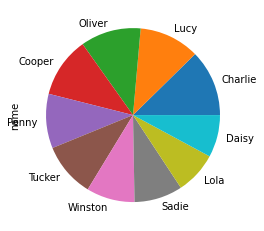

In [112]:
top_names2.plot(kind = "pie")

### Top 10 more common names of dogs:

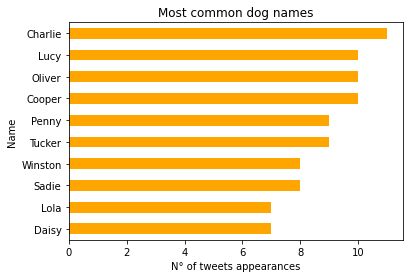

In [158]:
top_names2.plot(kind = "barh", title="Most common dog names", color= "orange" ).invert_yaxis()
plt.xlabel('N° of tweets appearances')
plt.ylabel('Name')
plt.show()

In [114]:
lowest_name = df_cleaned["name"].value_counts().tail(10)
lowest_name

Angel         1
Beebop        1
Longfellow    1
Bobble        1
Godzilla      1
Genevieve     1
Iggy          1
Hazel         1
Ace           1
Kramer        1
Name: name, dtype: int64

### Top 10 least common names of dogs:

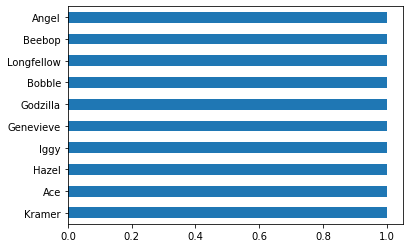

In [115]:
lowest_name.plot(kind = "barh").invert_yaxis()

In [116]:
#creating proportion of best ratings:
df_cleaned["rating_denominator"] = df_cleaned["rating_denominator"].astype(int)
df_cleaned["rating"] = df_cleaned["rating_numerator"]/df_cleaned["rating_denominator"]

In [117]:
#Create a table with only the tweet_id and rating created above:
table_rating = df_cleaned.pivot_table(index = "tweet_id", values = "rating")

### Top 5 tweets with the highest rating:

In [118]:
table_rating.sort_values("rating", ascending=False).iloc[:5]

,rating
tweet_id,
749981277374128128,177.6
670842764863651840,42.0
731156023742988288,20.4
758467244762497024,16.5
677716515794329600,14.4


In [119]:
highest_rating = df_cleaned[df_cleaned["tweet_id"] == "749981277374128128"]

In [120]:
highest_rating

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,time_timestamp,date_timestamp,doggo_lingo,...,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,rating
1017,749981277374128128,"<a href=""https://about.twitter.com/products/tw...",This is Atticus. He's quite simply America af....,https://twitter.com/dog_rates/status/749981277...,1776,10,Atticus,15:0:45,2016-07-04,without_lingo,...,bow_tie,0.533941,False,sunglasses,0.080822,False,sunglass,0.050776,False,177.6


In [121]:
#To find the url of the tweet with the highest rating:
highest_rating["jpg_url"]

1017    https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg
Name: jpg_url, dtype: object

### Image with the highest rating: 

The highest rating goes to Atticus


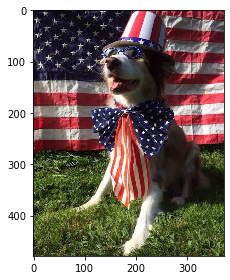

In [146]:
from skimage import io

print("The highest rating goes to Atticus")
io.imshow(io.imread("https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg"))
io.show()


#### Because p1 is the algorithm's #1 prediction for the image in the tweet, we will see the breeds that appear more in the prediction:

In [147]:
#Top 5 breeds predicted: 
top_breeds = df_cleaned["p1"].value_counts()[:5].sort_values(ascending=False)
top_breeds

golden_retriever      143
Labrador_retriever     96
Pembroke               88
Chihuahua              79
pug                    54
Name: p1, dtype: int64

In [124]:
#The percentages were calculated considering that the total tweets are 2086:
breed = ["golden_retriever", "Labrador_retriever","Pembroke", "Chihuahua", "pug"]
quantity_prediction = [143, 96, 88, 79, 54]


### Top 5 breeds predicted:

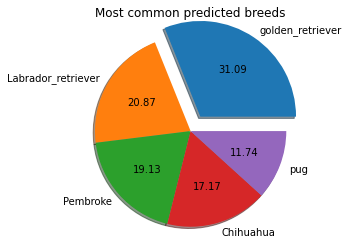

In [125]:
plt.pie(quantity_prediction, labels= breed, radius = 1.1, shadow = True, explode = [0.2, 0, 0,0,0], autopct='%.2f')
plt.title("Most common predicted breeds")


plt.show()

In [126]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2005 entries, 0 to 2186
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2005 non-null   object 
 1   source              2005 non-null   object 
 2   text                2005 non-null   object 
 3   expanded_urls       2005 non-null   object 
 4   rating_numerator    2005 non-null   int64  
 5   rating_denominator  2005 non-null   int32  
 6   name                2005 non-null   object 
 7   time_timestamp      2005 non-null   object 
 8   date_timestamp      2005 non-null   object 
 9   doggo_lingo         2005 non-null   object 
 10  retweet_count       2005 non-null   int64  
 11  favorite_count      2005 non-null   int64  
 12  jpg_url             2005 non-null   object 
 13  img_num             2005 non-null   float64
 14  p1                  2005 non-null   object 
 15  p1_conf             2005 non-null   float64
 16  p1_dog

In [127]:
doggo_lingo_table = df_cleaned["doggo_lingo"].value_counts()[1:5]
doggo_lingo_table

pupper     212
doggo       74
puppo       23
floofer      8
Name: doggo_lingo, dtype: int64

### Most tweeted doggo lingo: 

<AxesSubplot:title={'center':'Most tweeted doggo lingo/dog stage'}>

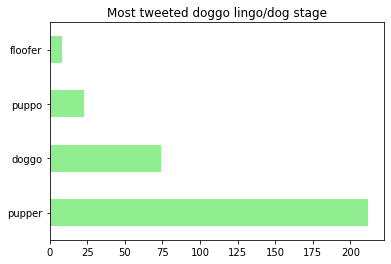

In [128]:
doggo_lingo_table.plot(kind="barh", color = "lightgreen", title = "Most tweeted doggo lingo/dog stage", y=sum)


In [129]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2005 entries, 0 to 2186
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2005 non-null   object 
 1   source              2005 non-null   object 
 2   text                2005 non-null   object 
 3   expanded_urls       2005 non-null   object 
 4   rating_numerator    2005 non-null   int64  
 5   rating_denominator  2005 non-null   int32  
 6   name                2005 non-null   object 
 7   time_timestamp      2005 non-null   object 
 8   date_timestamp      2005 non-null   object 
 9   doggo_lingo         2005 non-null   object 
 10  retweet_count       2005 non-null   int64  
 11  favorite_count      2005 non-null   int64  
 12  jpg_url             2005 non-null   object 
 13  img_num             2005 non-null   float64
 14  p1                  2005 non-null   object 
 15  p1_conf             2005 non-null   float64
 16  p1_dog

### *Clean.11:
Transform dataype for retweet and favorite count to int type from float type

### *Describe.11:
Using .astype(int) to transform the datatype for the columns retweet_count and favorite_count


In [130]:
df_cleaned["retweet_count"] = df_cleaned["retweet_count"].astype(int)
df_cleaned["favorite_count"] = df_cleaned["favorite_count"].astype(int)

### *Test.11: 
See if the dtype changed from float to int for retweet_count and favorite_count

In [131]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2005 entries, 0 to 2186
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2005 non-null   object 
 1   source              2005 non-null   object 
 2   text                2005 non-null   object 
 3   expanded_urls       2005 non-null   object 
 4   rating_numerator    2005 non-null   int64  
 5   rating_denominator  2005 non-null   int32  
 6   name                2005 non-null   object 
 7   time_timestamp      2005 non-null   object 
 8   date_timestamp      2005 non-null   object 
 9   doggo_lingo         2005 non-null   object 
 10  retweet_count       2005 non-null   int32  
 11  favorite_count      2005 non-null   int32  
 12  jpg_url             2005 non-null   object 
 13  img_num             2005 non-null   float64
 14  p1                  2005 non-null   object 
 15  p1_conf             2005 non-null   float64
 16  p1_dog

In [132]:
subset_fr = df_cleaned.iloc[:, [0,10,11]]
subset_fr

,tweet_id,retweet_count,favorite_count
0,889665388333682689,8538,38818
1,889531135344209921,2321,15359
2,878776093423087618,4319,19763
3,874012996292530176,11007,35501
4,867421006826221569,2697,16755
...,...,...,...
2182,666049248165822465,41,111
2183,666044226329800704,147,311
2184,666033412701032449,47,128
2185,666029285002620928,48,132


In [133]:
corr = df_cleaned.corr()

### Correlation matrix: 

In [134]:
corr

,rating_numerator,rating_denominator,retweet_count,favorite_count,img_num,p1_conf,p2_conf,p3_conf,rating
rating_numerator,1.000000,NaN,0.013853,0.009988,-0.000637,-0.009170,-0.020551,-0.004051,1.000000
rating_denominator,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet_count,0.013853,NaN,1.000000,0.913726,0.105277,0.053994,-0.019747,-0.043978,0.013853
favorite_count,0.009988,NaN,0.913726,1.000000,0.134932,0.078797,-0.022582,-0.053088,0.009988
img_num,-0.000637,NaN,0.105277,0.134932,1.000000,0.203819,-0.156664,-0.141284,-0.000637
p1_conf,-0.009170,NaN,0.053994,0.078797,0.203819,1.000000,-0.511090,-0.709322,-0.009170
p2_conf,-0.020551,NaN,-0.019747,-0.022582,-0.156664,-0.511090,1.000000,0.482308,-0.020551
p3_conf,-0.004051,NaN,-0.043978,-0.053088,-0.141284,-0.709322,0.482308,1.000000,-0.004051
rating,1.000000,NaN,0.013853,0.009988,-0.000637,-0.009170,-0.020551,-0.004051,1.000000


<AxesSubplot:>

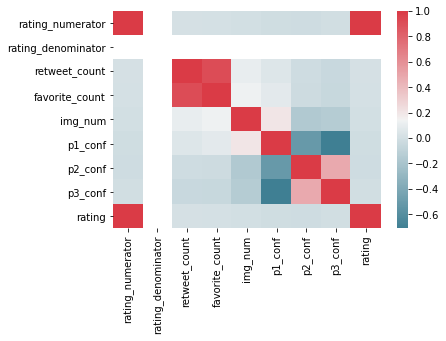

In [135]:
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, cmap=sns.diverging_palette(220, 10, as_cmap=True))

### Important insights: 
-From the correlation plot above we can see that favorite and retweet had a high correlation of 0.789513<br>

-On the other side, contrary as expected the rating column (rating_numerator/rating_denominator) has little correlation with the number of retweets or favorites a tweet gets, which is demostrated by a correlation of 0.012748 for retweet_count and 0.010148 for favorite_count. 

In [136]:
#Subset of only tweet_id and retweet_count:
subset_r = df_cleaned.iloc[:, [0,10]].sort_values("retweet_count", ascending=False)
subset_r.head()

,tweet_id,retweet_count
110,744234799360020481,79515
727,807106840509214720,56625
114,739238157791694849,52360
9,822872901745569793,48265
411,879415818425184262,45849


In [137]:
#Subset of only tweet_id and favorite_count:
subset_f = df_cleaned.iloc[:, [0,11]].sort_values("favorite_count", ascending=False)
subset_f.head()

,tweet_id,favorite_count
9,822872901745569793,132810
110,744234799360020481,131075
411,879415818425184262,107956
727,807106840509214720,107015
129,866450705531457537,106827


In [138]:
highest_retweet = df_cleaned[df_cleaned["tweet_id"] == "744234799360020481"]
highest_favorite = df_cleaned[df_cleaned["tweet_id"] == "822872901745569793"]

In [139]:
highest_retweet["jpg_url"]

110    https://pbs.twimg.com/ext_tw_video_thumb/74423...
Name: jpg_url, dtype: object

In [140]:
highest_favorite["jpg_url"]

9    https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg
Name: jpg_url, dtype: object

In [141]:
highest_favorite

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,time_timestamp,date_timestamp,doggo_lingo,...,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,rating
9,822872901745569793,"<a href=""http://twitter.com/download/iphone"" r...",Here's a super supportive puppo participating ...,https://twitter.com/dog_rates/status/822872901...,13,10,None,18:26:2,2017-01-21,puppo,...,Lakeland_terrier,0.196015,True,Labrador_retriever,0.160329,True,Irish_terrier,0.069126,True,1.3


In [142]:
highest_favorite["text"]

9    Here's a super supportive puppo participating ...
Name: text, dtype: object

### The highest favorited and 4th most retweeted dog: 

The highest favorited and 4th most retweeted dog is a Lakeland_terrier: 


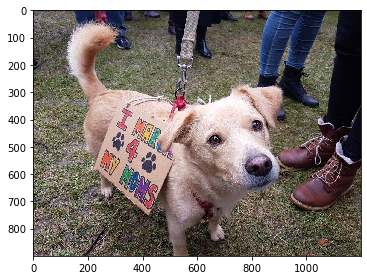

In [144]:
print("The highest favorited and 4th most retweeted dog is a Lakeland_terrier: ")
io.imshow(io.imread("https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg"))
io.show()

In [148]:
df_cleaned.to_csv(r'C:\Users\bianc\Documents\twitter_archive_master.csv', header=True)

### Conclusion:

To clean the dataframe it is not only a one phase stage, because as I got into the analysis and visualization of the dataframe, I could still see some quality problems that could have been solved before but were not as visible in the Clean stage as when I was truly interacting with the data. <br>

On the other side, data wrangling is one important step to get data analysis of quality and make good decisions based on a good profiled dataframe. However, it requires time and attention to notice problems. In adition, not always the gathering of the data will be as easy depending on where we get the data, mostly because of the missing values, different datatypes, or other problems. <br>

On specific, from the data recollected of WeRateDogs we could do some analysis for the most and least common names of dogs, the dogs with the highest ratings, the most tweeted dog stage, and the highest favorite and retweeted dog in the account.

### References used in this work:
- https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html
- https://stackoverflow.com/questions/34386751/pandas-convert-timestamp-to-datetime-date
- https://www.geeksforgeeks.org/python-pandas-isnull-and-notnull/
- https://www.rover.com/blog/uk/do-you-speak-doggolingo-dog-internet-jargon-explained/
- https://www.geeksforgeeks.org/get-the-hour-from-timestamp-in-pandas/
- https://cmdlinetips.com/2018/11/how-to-join-two-text-columns-into-a-single-column-in-pandas/#:~:text=Another%20way%20to%20join%20two%20columns%20in%20Pandas,df%20%5B%22Name%22%5D%20%3D%20df%20%5B%22First%22%5D%20%2B%20df%20%5B%22Last%22%5D
- https://www.kite.com/python/answers/how-to-count-the-number-of-rows-in-a-pandas-dataframe-in-python
- https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.melt.html
- https://www.kite.com/python/answers/how-to-change-values-in-a-pandas-dataframe-column-based-on-a-condition-in-python#:~:text=loc%20to%20change%20values%20in,for%20which%20condition%20is%20True%20.
- https://datatofish.com/rows-with-nan-pandas-dataframe/
- https://datatofish.com/export-dataframe-to-csv/
- https://etav.github.io/python/count_basic_freq_plot.html
- https://stackoverflow.com/questions/40911170/python-how-to-read-an-image-from-a-url